#### Bibliotecas utilizadas

In [1957]:
import os
import cv2
import json
import quaternion
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy import linalg
from matplotlib.image import imread
from matplotlib.patches import Patch
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

#### I - Imagens image_calib_X.jpg

##### 1 - Carregamento e plot das 9 imagens

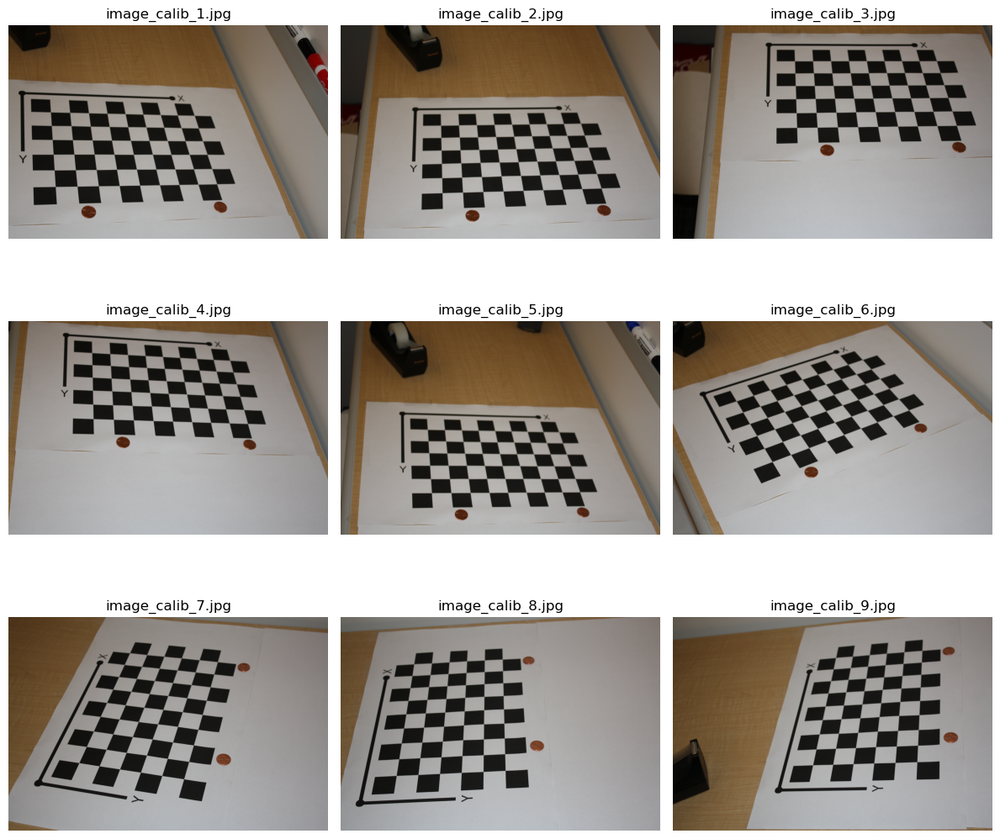

In [1961]:
images_count = 9  # Número de imagens
images_rgb   = [] # Lista para armazenar as imagens

# Carregar as imagens na lista
for i in range(1, images_count + 1):
    folder = 'Imagens//'
    file   = f'image_calib_{i}.jpg'
    img    = cv2.cvtColor(cv2.imread(folder + file), cv2.COLOR_BGR2RGB)
    images_rgb.append((img, file))      # Imagem e nome do arquivo

# Criar Grid 3x3 
fig, axs = plt.subplots(3, 3, figsize=(12, 12))

# Subplots
for j, (img, title) in enumerate(images_rgb):
    row = j // 3  
    col = j % 3  
    axs[row, col].imshow(img)
    axs[row, col].set_title(title)
    axs[row, col].axis('off') 

# Ajustar espaçamento entre os subplots
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

##### 2 - Detecção dos cantos dos quadros

In [1931]:
# Criterio de parada do algoritmo
criteria     = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)  

images_count = 9     # Número de imagens
imgpoints    = []    # Lista para armazenar os pontos dos cantos 
images_path  = []    # Lista para armazenar os caminhos das imagens
images_gray  = []    # Lista para armazenar as imagens em escala de cinza
nx,ny        = 9,6   # Número de cantos na direção do eixo x e y respectivamente 
square_size  = 0.029 # Tamanho do lado do quadrado no mundo real (0.029m x 0.029m) 

# Carregar as imagens na lista
for i in range(1, images_count + 1):
    folder = 'Imagens//'
    file   = f'image_calib_{i}.jpg'
    images_path.append(folder + file)   # Armazena o caminho do arquivo

# Obtenção dos pontos dos cantos
for fname in images_path:
    img  = cv2.imread(fname)                     # Carrega a imagem
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # Converte a imagem pra escala de cinza
    images_gray.append(gray)                     # Armazena a imagem em escala de cinza
    
    # Cálculo preliminar dos pontos
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None) 
 
    # Se pontos encontrados, refina o resultado encontrando pontos mais precisos
    if ret == True:
        corners2 = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria) # Pontos refinados
        imgpoints.append(corners2)

##### 3 - Plot dos pontos detectados no item anterior em cada uma das imagens

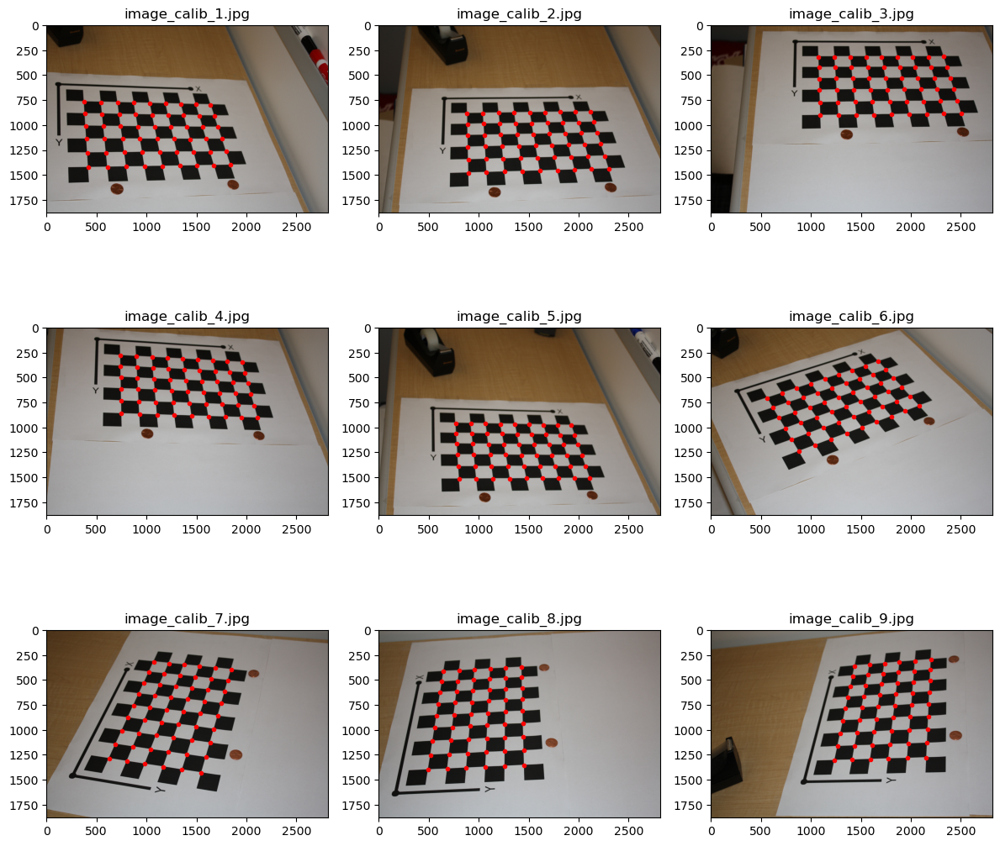

In [1933]:
# Criar Grid 3x3 
fig, axs = plt.subplots(3, 3, figsize=(12, 12))

# Subplots
for j, (img, title) in enumerate(images_rgb):
    row = j // 3  
    col = j % 3  
    axs[row, col].imshow(img)
    axs[row, col].set_title(title)
    pts = np.array(imgpoints[j]).reshape(54,2)

    # Plot dos pontos na imagem    
    for k in range(pts.shape[0]):
        axs[row, col].plot(pts[k][0], pts[k][1], marker='.', color="red")

# Ajustar espaçamento entre os subplots
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

##### 4 - Criação do vetor com as coordendas X,Y representando coordenadas do mundo real dos 54 cantos dos quadrados do tabuleiro.

In [1935]:
objpoints = []  # Lista para armazenar os pontos 3D do mundo

# Define os pontos 3D do tabuleiro
objp = np.zeros((nx * ny, 3), np.float32)
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2) * square_size

# Armazena os pontos 3D do tabuleiro para cada imagem
for i in range(images_count):
    objpoints.append(np.copy(objp)) 

##### 5 - Obtenção dos parâmetros da câmera

In [1963]:
# Calibração da câmera com todas as imagens
ret, camera_matrix, distortion, rotation_vecs, translation_vecs = cv2.calibrateCamera(
    objpoints,                   # Lista de pontos no mundo real (3D)
    imgpoints,                   # Lista de pontos de imagem (2D)
    images_gray[0].shape[::-1],  # Resolução da imagem (largura, altura)
    None,                        # Sem matriz inicial de câmera
    None                         # Sem coeficientes iniciais de distorção
)

print("Erro de reprojeção : \n", ret)
print("\nCoeficientes de distorção : \n", distortion)

# Obtendo as matrizes de rotação 
R = np.zeros([images_count,3,3])
for i in range(images_count):
    R[i],_ = cv2.Rodrigues(rotation_vecs[i])

# Obtendo as poses da câmera em coordenadas homogêneas
H = np.zeros([images_count,4,4])
for j in range(images_count):
    r  = np.array(R[j])
    t  = np.array(translation_vecs[j])
    h1 = np.hstack((r,t))
    h2 = np.array([0,0,0,1])
    H[j] = np.vstack((h1,h2))

Erro de reprojeção : 
 0.9460627447798211

Coeficientes de distorção : 
 [[-1.27381771e-01  3.56179732e+00  1.34917460e-03  3.22292062e-03
  -3.46539624e+01]]


##### 6 - Visualização dos parâmetros extrínsecos da câmera.

##### Parâmetros extrínsecos da câmera.

In [2032]:
for j in range(images_count):
    print(f"Imagem {j+1}:")
    print("")
    print("Matriz R de rotação")
    print(R[j])
    print("")
    print("Vetor t de translação: ")
    print(translation_vecs[j])
    print("")

Imagem 1:

Matriz R de rotação
[[ 0.90957333  0.41059243 -0.06395486]
 [-0.29269177  0.74228251  0.60278371]
 [ 0.294971   -0.52955692  0.7953374 ]]

Vetor t de translação: 
[[-0.16048033]
 [-0.01788654]
 [ 0.81752451]]

Imagem 2:

Matriz R de rotação
[[ 0.97677817 -0.13227281 -0.16854764]
 [ 0.21166843  0.7175813   0.66353113]
 [ 0.03317951 -0.68379893  0.72891573]]

Vetor t de translação: 
[[-0.2261392 ]
 [-0.04895328]
 [ 0.94445409]]

Imagem 3:

Matriz R de rotação
[[ 0.9783921   0.17986243 -0.1019726 ]
 [-0.0734808   0.76348374  0.64163319]
 [ 0.19326012 -0.62027581  0.76020289]]

Vetor t de translação: 
[[-0.14634633]
 [-0.0334574 ]
 [ 0.96086128]]

Imagem 4:

Matriz R de rotação
[[ 0.80460119  0.58286013 -0.11353853]
 [-0.40884588  0.68241799  0.60592964]
 [ 0.43065297 -0.44111195  0.78737429]]

Vetor t de translação: 
[[-0.16703496]
 [-0.01739937]
 [ 0.9063762 ]]

Imagem 5:

Matriz R de rotação
[[ 0.98155886  0.13322691 -0.13708679]
 [-0.07943981  0.93655887  0.34138953]
 [ 0.17

##### Visualização dos parâmetros extrínsecos 

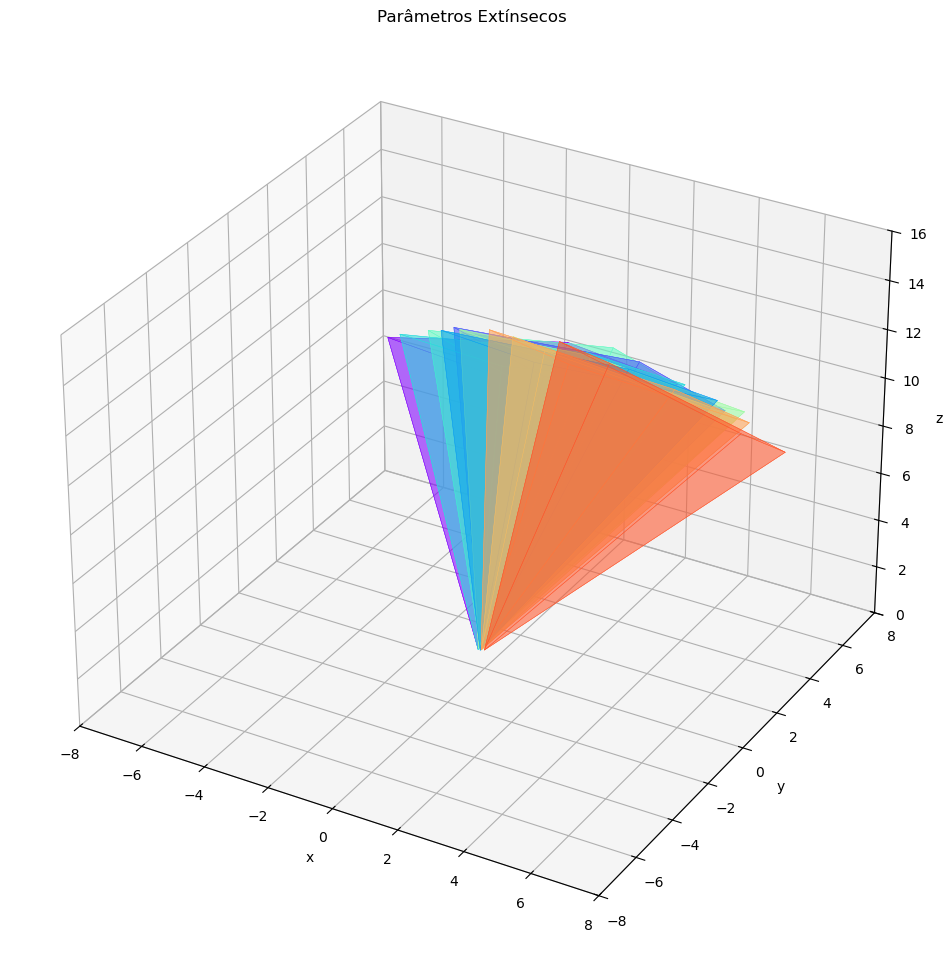

In [1971]:
# Limites mínimo/máximo dos eixos x, y e z
visualizer = CameraPoseVisualizer([-8, 8], [-8, 8], [0, 16])

# Loop para adicionar cada frame ao gráfico
for i in range(images_count):
    color = plt.cm.rainbow(i / images_count)  # Gradiente entre vermelho e violeta
    visualizer.extrinsic2pyramid(H[i], color=color, focal_len_scaled=10)

visualizer.show()

Utilizando o módulo **"extrinsic2pyramid"**, que está disponível no apêndice deste documento, é possível visualizar as poses da câmera em um espaço 3D. A pose da câmera é representada por uma pirâmide quadrada no espaço tridimensional, onde:

- **O topo da pirâmide** (o vértice que não está no plano da base quadrada) representa o **centro da câmera**. Este ponto corresponde à localização da câmera no espaço tridimensional.
- **O eixo principal** da câmera é representado por uma linha que parte do centro da câmera, passa pelo centro da base da pirâmide (o ponto central do quadrado) e aponta na direção ortogonal à base.

O frame de cada imagem é representado por uma pirâmide de cor diferente, considerando que:  

- O eixo principal cresce no sentido positivo de **Z**.  
- A representação dos valores do eixo **Y** no matplotlib cresce de cima para baixo.  

É possível verificar que a câmera foi apontada para frente (**eixo Z positivo**) e para baixo (**sentido de crescimento do eixo Y**).  Isso condiz com as perspectivas das imagens usadas, indicando que as imagens foram tiradas de uma posição mais alta que o tabuleiro, com a câmera apontando de cima para baixo.  

##### 7 - Parâmetros intrínsecos da câmera.

##### A partir da matriz da câmera obtida anteriormente é possível extrair os seus parâmetros instínsecos

$$ 
K =
\begin{bmatrix}
\alpha_x & 0 & x_0 \\
0 & \alpha_y & y_0 \\
0 & 0 & 1
\end{bmatrix}
$$

In [1973]:
print("\nMatriz da Câmera : \n", camera_matrix)


Matriz da Câmera : 
 [[4.63511040e+03 0.00000000e+00 1.46278138e+03]
 [0.00000000e+00 4.61457213e+03 9.51144869e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


- \( $\alpha_x$ = 4635.11040 \): Distância focal no eixo **x** (horizontal), em pixels.  
- \( $\alpha_y$ = 4614.57213 \): Distância focal no eixo **y** (vertical), em pixels.  
- \( $x_0$ = 1462.78138 \): Coordenada \(x\) do ponto principal.  
- \( $y_0$ = 951.14487 \): Coordenada \(y\) do ponto principal.   

#### II - Imagens image_dist_X.jpg

##### Algumas células desta seção foram ocultadas por serem iguais as da seção anterior 

##### 1 - Carregamento e plot das 10 imagens

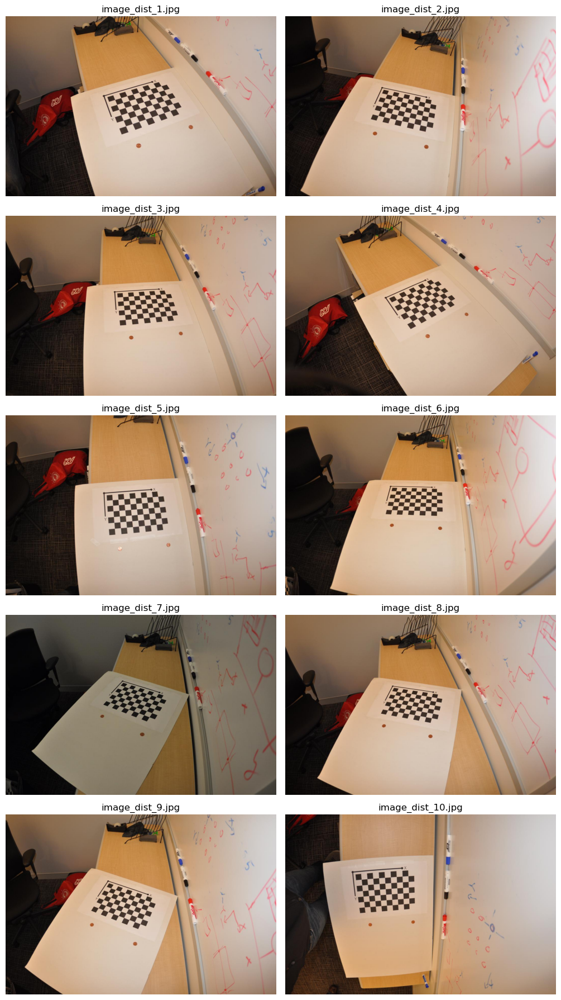

In [1975]:
images_count = 10 # Número de imagens
images_rgb   = [] # Lista para armazenar as imagens

# Carregar as imagens na lista
for i in range(1, images_count + 1):
    folder = 'Imagens//'
    file   = f'image_dist_{i}.jpg'
    img    = cv2.cvtColor(cv2.imread(folder + file), cv2.COLOR_BGR2RGB)
    images_rgb.append((img, file))      # Imagem e nome do arquivo

# Criar Grid 5x2 
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Subplots
for j, (img, title) in enumerate(images_rgb):
    row = j // 2 
    col = j % 2  
    axs[row, col].imshow(img)
    axs[row, col].set_title(title)
    axs[row, col].axis('off') 

# Ajustar espaçamento entre os subplots
plt.tight_layout(rect=[0, 0, 1, 1.5])
plt.show()

##### É possível observar que as imagens foram tiradas com a câmera de uma posição mais distante e que há presença de distorção radial.

##### 2 - Detecção dos cantos dos quadros

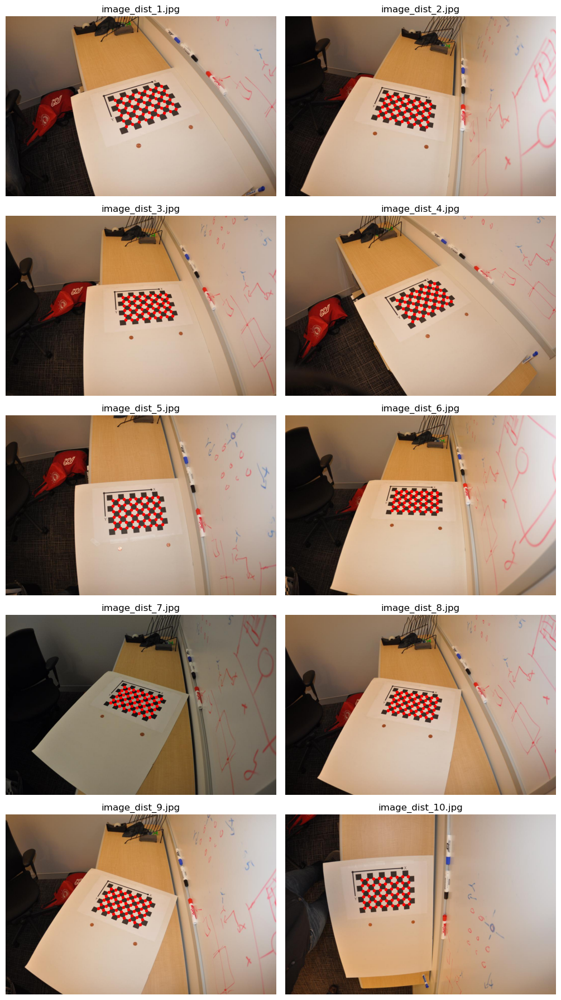

In [1979]:
# Criterio de parada do algoritmo
criteria     = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)  

imgpoints    = []    # Lista para armazenar os pontos dos cantos 
images_path  = []    # Lista para armazenar os caminhos das imagens
images_gray  = []    # Lista para armazenar as imagens em escala de cinza
nx,ny        = 9,6   # Número de cantos na direção do eixo x e y respectivamente 
square_size  = 0.029 # Tamanho do lado do quadrado no mundo real (0.029m x 0.029m) 

# Carregar as imagens na lista
for i in range(1, images_count + 1):
    folder = 'Imagens//'
    file   = f'image_dist_{i}.jpg'
    images_path.append(folder + file)   # Armazena o caminho do arquivo

# Obtenção dos pontos dos cantos
for fname in images_path:
    img  = cv2.imread(fname)                     # Carrega a imagem
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # Converte para escala de cinza
    images_gray.append(gray)                     
    
    # Cálculo preliminar dos pontos
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None) 
 
    # Se pontos encontrados, refina o resultado encontrando pontos mais precisos
    if ret == True:
        corners2 = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria) # Pontos refinados
        imgpoints.append(corners2)

# Grid 5x2 
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Subplots
for j, (img, title) in enumerate(images_rgb):
    row = j // 2  
    col = j % 2  
    axs[row, col].imshow(img)
    axs[row, col].set_title(title)
    axs[row, col].axis('off') 
    pts = np.array(imgpoints[j]).reshape(-1,2)

    # Plot dos pontos na imagem    
    for k in range(len(pts)):
        axs[row, col].plot(pts[k][0], pts[k][1], marker='.', color="red")

# Ajustar espaçamento entre os subplots
plt.tight_layout(rect=[0, 0, 1, 1.5])
plt.show()

##### 3 - Obtenção e visualização dos parâmetros da câmera

In [1982]:
objpoints   = []  # Lista para armazenar os pontos 3D do mundo
objp        = np.zeros((nx * ny, 3), np.float32)
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2) * square_size

# Armazena os pontos 3D do tabuleiro para cada imagem
for i in range(images_count):
    objpoints.append(np.copy(objp))  

# Calibração da câmera com todas as imagens
ret, camera_matrix, distortion, rotation_vecs, translation_vecs = cv2.calibrateCamera(
    objpoints,                   # Lista de pontos no mundo real (3D)
    imgpoints,                   # Lista de pontos de imagem (2D)
    images_gray[0].shape[::-1],  # Resolução da imagem (largura, altura)
    None,                        # Sem matriz inicial de câmera
    None,                        # Sem coeficientes iniciais de distorção
)

print("Erro de reprojeção : \n", ret)
print("\nCoeficientes de distorção : \n", distortion)

# Obtendo as matrizes de rotação 
R = np.zeros([images_count,3,3])
for i in range(images_count):
    R[i],_ = cv2.Rodrigues(rotation_vecs[i])

# Obtendo as poses da câmera em coordenadas homogêneas
H = np.zeros([images_count,4,4])
for j in range(images_count):
    r  = np.array(R[j])
    t  = np.array(translation_vecs[j])
    h1 = np.hstack((r,t))
    h2 = np.array([0,0,0,1])
    H[j] = np.vstack((h1,h2))

Erro de reprojeção : 
 0.2338513092913981

Coeficientes de distorção : 
 [[-0.42311541  0.45037866  0.0038746  -0.00582401 -0.25324731]]


##### Parâmetros extrínsecos da câmera.

In [2030]:
for j in range(images_count):
    print(f"Imagem {j+1}:")
    print("")
    print("Matriz R de rotação")
    print(R[j])
    print("")
    print("Vetor t de translação: ")
    print(translation_vecs[j])
    print("")

Imagem 1:

Matriz R de rotação
[[ 0.90957333  0.41059243 -0.06395486]
 [-0.29269177  0.74228251  0.60278371]
 [ 0.294971   -0.52955692  0.7953374 ]]

Vetor t de translação: 
[[-0.16048033]
 [-0.01788654]
 [ 0.81752451]]

Imagem 2:

Matriz R de rotação
[[ 0.97677817 -0.13227281 -0.16854764]
 [ 0.21166843  0.7175813   0.66353113]
 [ 0.03317951 -0.68379893  0.72891573]]

Vetor t de translação: 
[[-0.2261392 ]
 [-0.04895328]
 [ 0.94445409]]

Imagem 3:

Matriz R de rotação
[[ 0.9783921   0.17986243 -0.1019726 ]
 [-0.0734808   0.76348374  0.64163319]
 [ 0.19326012 -0.62027581  0.76020289]]

Vetor t de translação: 
[[-0.14634633]
 [-0.0334574 ]
 [ 0.96086128]]

Imagem 4:

Matriz R de rotação
[[ 0.80460119  0.58286013 -0.11353853]
 [-0.40884588  0.68241799  0.60592964]
 [ 0.43065297 -0.44111195  0.78737429]]

Vetor t de translação: 
[[-0.16703496]
 [-0.01739937]
 [ 0.9063762 ]]

Imagem 5:

Matriz R de rotação
[[ 0.98155886  0.13322691 -0.13708679]
 [-0.07943981  0.93655887  0.34138953]
 [ 0.17

##### Visualização dos parâmetros extrínsecos 

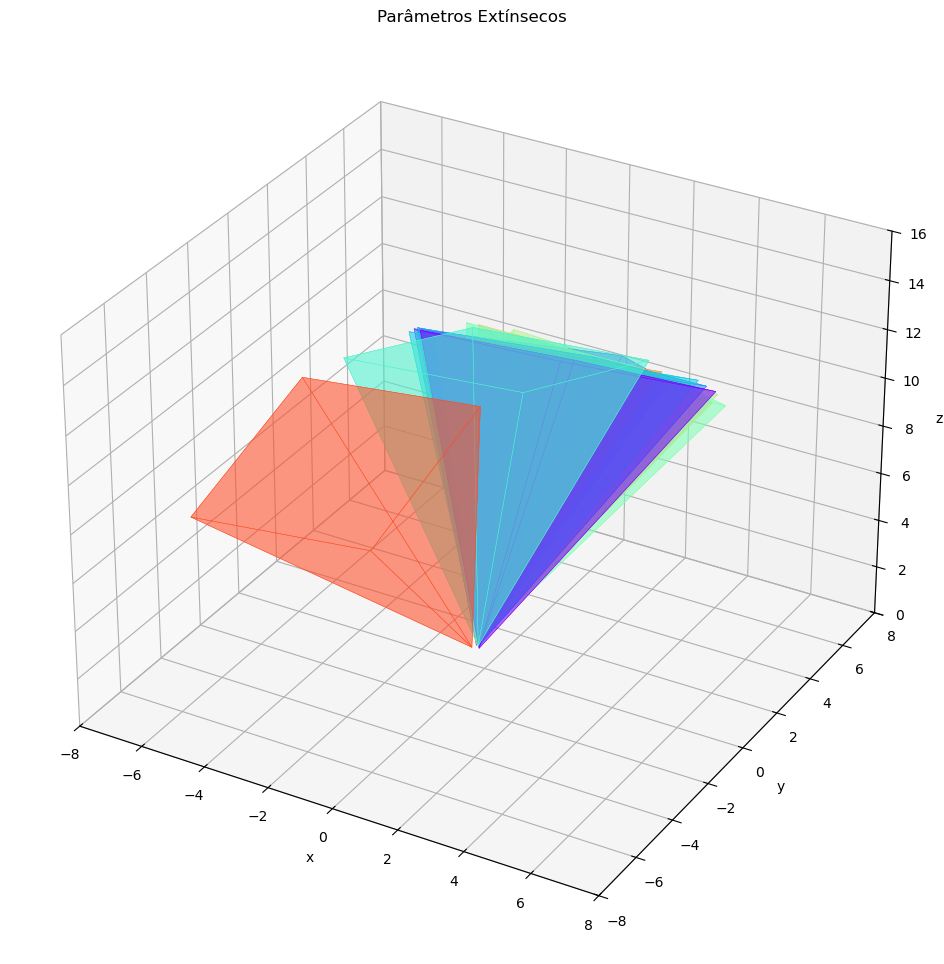

In [2009]:
# Limites mínimo/máximo dos eixos x, y e z
visualizer = CameraPoseVisualizer([-8, 8], [-8, 8], [0, 16])

# Loop para adicionar cada frame ao gráfico
for i in range(images_count):
    color = plt.cm.rainbow(i / images_count)  # Gradiente entre vermelho e violeta
    visualizer.extrinsic2pyramid(H[i], color=color, focal_len_scaled=10)

visualizer.show()

##### Parâmetros intrínsecos da câmera.

In [2012]:
print("\nMatriz da Câmera : \n", camera_matrix)


Matriz da Câmera : 
 [[733.48208326   0.         575.6149048 ]
 [  0.         733.72957784 346.82710624]
 [  0.           0.           1.        ]]


- \( $\alpha_x$ = 733.48208 \): Distância focal no eixo **x** (horizontal), em pixels.  
- \( $\alpha_y$ = 733.72958 \): Distância focal no eixo **y** (vertical), em pixels.  
- \( $x_0$ = 575.61490  \): Coordenada \(x\) do ponto principal (centro ótico da câmera).  
- \( $y_0$ = 346.82710 \): Coordenada \(y\) do ponto principal (centro ótico da câmera).   

##### 4- Removendo a distorção e mostrando as imagens

##### Remoção das distorções nas imagens

In [2017]:
undistorted = []  # Lista para armazenar as imagens retificadas

for j, file in enumerate(images_path):
    img = cv2.imread(file)
    h, w = img.shape[:2]

    # Obter uma nova matriz de câmera
    newcameramtx, roi = cv2.getOptimalNewCameraMatrix(camera_matrix, distortion, (w, h), 1, (w, h))

    # Corrige a distorção da imagem
    undistorted_img = cv2.undistort(img, camera_matrix, distortion, None, newcameramtx) 
    
    undistorted.append(undistorted_img)
    
    output_path = f'Imagens/image_retificada_{j+1}.jpg'
    cv2.imwrite(output_path, undistorted_img)         # Salva a imagem

##### Plotando as imagens originais e as retificadas

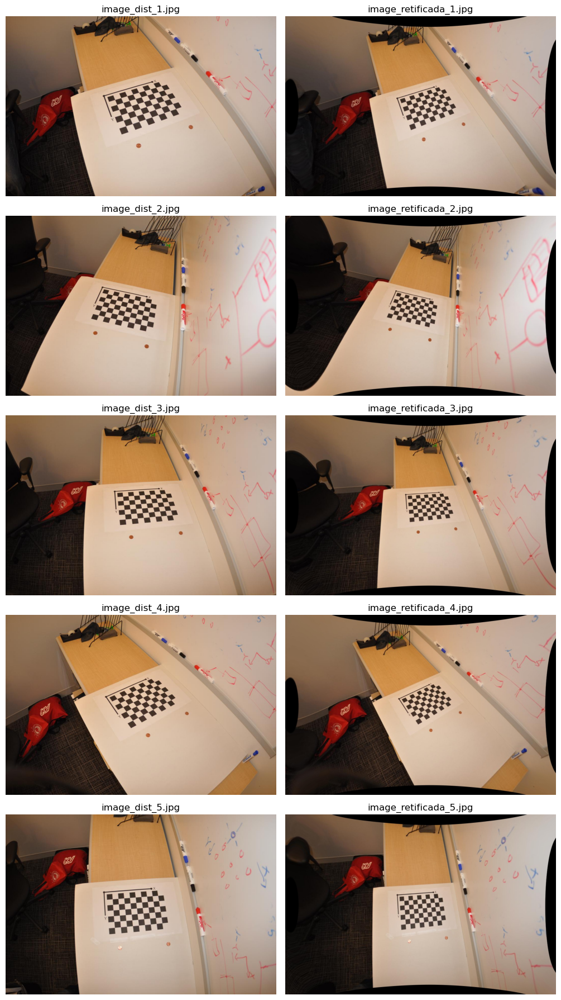

In [2053]:
images_rect = []  # Lista para armazenar as imagens retificadas

# Carregar imagens 
for i in range(1, images_count + 1):
    folder = 'Imagens//'
    file_original  = f'image_dist_{i}.jpg'
    file_rectified = f'image_retificada_{i}.jpg'

    # Carregar e converter para RGB
    img_original  = cv2.cvtColor(cv2.imread(folder + file_original), cv2.COLOR_BGR2RGB)
    img_rectified = cv2.cvtColor(cv2.imread(folder + file_rectified), cv2.COLOR_BGR2RGB)

    images_rgb.append((img_original, file_original))
    images_rect.append((img_rectified, file_rectified))

# Grid 5x2
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Plotar imagens lado a lado
for j in range(5):
    img_original, title_original = images_rgb[j]
    img_rectified, title_rectified = images_rect[j]

    axs[j, 0].imshow(img_original)
    axs[j, 0].set_title(title_original)
    axs[j, 0].axis('off')

    axs[j, 1].imshow(img_rectified)
    axs[j, 1].set_title(title_rectified)
    axs[j, 1].axis('off')

# Ajustar espaçamento 
plt.tight_layout(rect=[0, 0, 1, 1.5])
plt.show()

##### Plot dividido em 2 partes para melhor visualização no documento

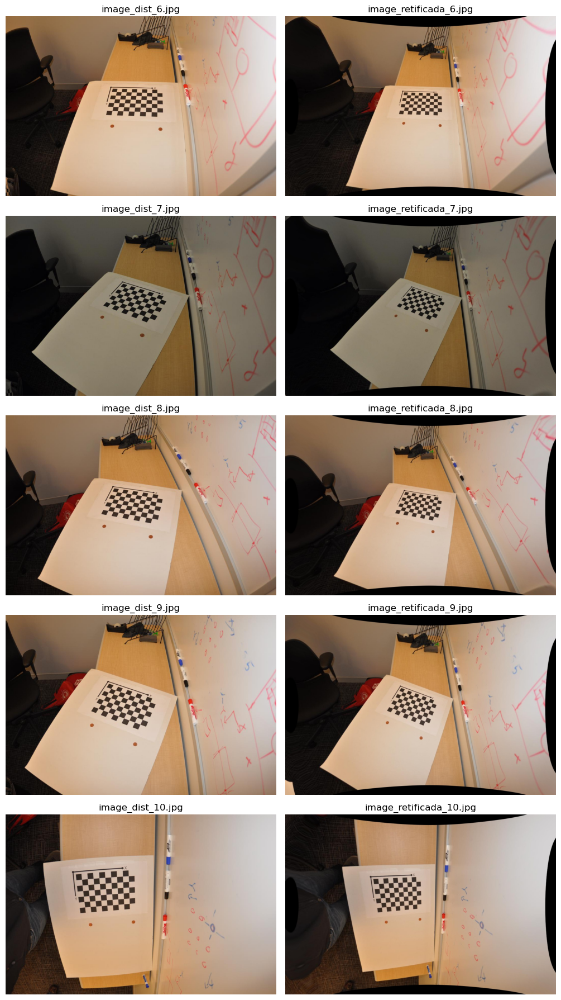

In [2051]:
# Grid 5x2
fig, axs = plt.subplots(5, 2, figsize=(12, 12))

# Plotar imagens lado a lado
for j in range(5):
    img_original, title_original = images_rgb[j+5]
    img_rectified, title_rectified = images_rect[j+5]

    axs[j, 0].imshow(img_original)
    axs[j, 0].set_title(title_original)
    axs[j, 0].axis('off')

    axs[j, 1].imshow(img_rectified)
    axs[j, 1].set_title(title_rectified)
    axs[j, 1].axis('off')

# Ajustar espaçamento 
plt.tight_layout(rect=[0, 0, 1, 1.5])
plt.show()

##### É possível observar que linhas que deveriam ser retas nas imagens originais mas não são devido a distorção(Linhas da mesa, bordas do quadro, rodapés da parede e etc..) foram aproximadamente retificadas, apresentando linhas mais retas que as imagens originais. 

#### Apêndice

##### Este projeto utiliza o módulo ligeiramente modificado do repositório [`extrinsic2pyramid`](https://github.com/demul/extrinsic2pyramid/tree/main) para visualização dos parâmetros extrínsecos das câmeras.

##### Funções utilizadas

In [2025]:
class CameraParameterLoader:
    def __init__(self):
        print('initialize camera parameter lodaer')

    def get_intrinsic(self, path):
        with open(os.path.join(path, '_camera_settings.json'), 'r') as f:
            param_cam = json.load(f)
            param_intrinsic = param_cam['camera_settings'][0]['intrinsic_settings']
            cx = param_intrinsic['cx']
            cy = param_intrinsic['cy']
            fx = param_intrinsic['fx']
            fy = param_intrinsic['fy']
            s  = param_intrinsic['s']
            mat_intrinsic = np.array([[fx, s, cx],
                                      [0, fy, cy],
                                      [0, 0, 1]])
        return mat_intrinsic

    def get_extrinsic(self, path):
        with open(path, 'r') as f:
            param_cam = json.load(f)['camera_data']
            param_translation = param_cam['location_worldframe']
            param_rotation = param_cam['quaternion_xyzw_worldframe']

            mat_rotation = quaternion.as_rotation_matrix(
                np.quaternion(param_rotation[3], param_rotation[0], param_rotation[1], param_rotation[2]))
            mat_translation = np.array([[param_translation[0]], [param_translation[1]], [param_translation[2]]])
            mat_extrinsic = np.concatenate(
                [np.concatenate([mat_rotation, mat_translation], axis=1), np.array([[0, 0, 0, 1]])], axis=0)
            return mat_extrinsic
            
class CameraPoseVisualizer:
    def __init__(self, xlim, ylim, zlim):
        self.fig = plt.figure(figsize=(18, 12))
        # Use add_subplot com o parâmetro projection='3d'
        self.ax = self.fig.add_subplot(111, projection='3d')  # Alteração aqui
        self.ax.set_aspect("auto")
        self.ax.set_xlim(xlim)
        self.ax.set_ylim(ylim)
        self.ax.set_zlim(zlim)
        self.ax.set_xlabel('x')
        self.ax.set_ylabel('y')
        self.ax.set_zlabel('z')

    def extrinsic2pyramid(self, extrinsic, color='r', focal_len_scaled=5, aspect_ratio=0.3):
        vertex_std = np.array([[0, 0, 0, 1],
                               [focal_len_scaled * aspect_ratio, -focal_len_scaled * aspect_ratio, focal_len_scaled, 1],
                               [focal_len_scaled * aspect_ratio, focal_len_scaled * aspect_ratio, focal_len_scaled, 1],
                               [-focal_len_scaled * aspect_ratio, focal_len_scaled * aspect_ratio, focal_len_scaled, 1],
                               [-focal_len_scaled * aspect_ratio, -focal_len_scaled * aspect_ratio, focal_len_scaled, 1]])
        vertex_transformed = vertex_std @ extrinsic.T
        meshes = [[vertex_transformed[0, :-1], vertex_transformed[1][:-1], vertex_transformed[2, :-1]],
                            [vertex_transformed[0, :-1], vertex_transformed[2, :-1], vertex_transformed[3, :-1]],
                            [vertex_transformed[0, :-1], vertex_transformed[3, :-1], vertex_transformed[4, :-1]],
                            [vertex_transformed[0, :-1], vertex_transformed[4, :-1], vertex_transformed[1, :-1]],
                            [vertex_transformed[1, :-1], vertex_transformed[2, :-1], vertex_transformed[3, :-1], vertex_transformed[4, :-1]]]
        self.ax.add_collection3d(
            Poly3DCollection(meshes, facecolors=color, linewidths=0.3, edgecolors=color, alpha=0.35))

    def customize_legend(self, list_label):
        list_handle = []
        for idx, label in enumerate(list_label):
            color = plt.cm.rainbow(idx / len(list_label))
            patch = Patch(color=color, label=label)
            list_handle.append(patch)
        plt.legend(loc='right', bbox_to_anchor=(1.8, 0.5), handles=list_handle)

    def colorbar(self, max_frame_length):
        cmap = mpl.cm.rainbow
        norm = mpl.colors.Normalize(vmin=0, vmax=max_frame_length)
        self.fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), orientation='vertical', label='Frame Number')

    def show(self):
        plt.title('Parâmetros Extínsecos')
        plt.show()